### Dependencias

In [1]:
%pip install -q plotly
%pip install -q --upgrade nbformat
import plotly.graph_objects as go
import numpy as np

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## Ejercicio 1: Lagrange — Casos básicos (I)

Se pretende optimizar el siguiente problema:
$$
\begin{aligned}
\mathrm{maximizar} \quad f(x,y)= x + y & \\
\text{ sujeto a } \quad g(x, y) \equiv x^2 + y^2 &= 1
\end{aligned}
$$
usando el método de los multiplicadores de Lagrange. A continuación se definen en Python varias funciones relevantes para este caso de estudio:


In [2]:
# Define the objective function f(x, y)
def f(x, y):
    return x + y

def grad_f(x, y):
    return np.array([1, 1])

# Define the constraint function g(x, y)
def g(x, y):
    return x**2 + y**2 - 1

# Define the Lagrangian function L(x, y, lambda)
def lagrangian(x, y, lambda_):
    return f(x, y) + lambda_ * g(x, y)

 - **1a** El siguiente bloque de código muestra en un gráfico 3D la función a maximizar $f(x,y)$, la restricción $g(x,y)$ sobre el plano $OXY$ y su proyección sobre $f(x,y)$. Estima visualmente dónde aparecerá el máximo del problema.

In [3]:
# Create a grid of x and y values
x = np.linspace(-1.1, 1.1, 200)
y = np.linspace(-1.1, 1.1, 200)
X, Y = np.meshgrid(x, y)

# Calculate the function values
Z = X + Y
Z2 = np.cos(X) + np.sin(Y)

# Create the 3D surface plot
fig = go.Figure()

# Add the 3D surface plot for the function f(x, y) = x + y
fig.add_trace(go.Surface(z=Z, x=X, y=Y, name='f(x, y) = x + y', showscale=False))

# Create the 2D circle curve in the OXY plane
t = np.linspace(0, 2 * np.pi, 100)
circle_x = np.cos(t)
circle_y = np.sin(t)

trace_circle_OXY = go.Scatter3d(
    x=circle_x,
    y=circle_y,
    z=np.zeros_like(circle_x),
    mode='lines',
    marker=dict(color='black', size=20),
    line=dict(width=20),
    showlegend=False
)

# Create the 2D circle projection onto the plane z = x + y
trace_circle_proj = go.Scatter3d(
    x=circle_x,
    y=circle_y,
    z=np.cos(t) + np.sin(t),
    mode='lines',
    marker=dict(color='green', size=20),
    line=dict(width=20),
    showlegend=False
)


# Add the 2D circle curve and its projection to the 3D plot
fig.add_trace(trace_circle_OXY)
fig.add_trace(trace_circle_proj)

# Show the 3D plot
fig.show()

 - **1b** Resuelve el sistema de ecuaciones resultante de plantear el problema de Lagrange. Utiliza el módulo ```scipy.optimize``` para su resolución.

In [4]:
from scipy.optimize import fsolve, root

def equations(vars):
    x, y, lamb = vars

    eq1 = 1.0 + 2.0 * lamb * x
    eq2 = 1.0 + 2.0 * lamb * y
    eq3 = x**2 + y**2 - 1.0

    return [eq1, eq2, eq3]

x_opt, y_opt, lamb_opt = fsolve(equations, (-1,-1,1))

print(x_opt, y_opt, lamb_opt)


-0.7071067811852624 -0.7071067811852624 0.7071067811891182


 - **1c** El siguiente bloque de código muestra las cuervas de nivel de la función a optimizar, junto con la curva restricción. En base a esta imagen, analiza geométricamente el problema de optimización de Lagrange.

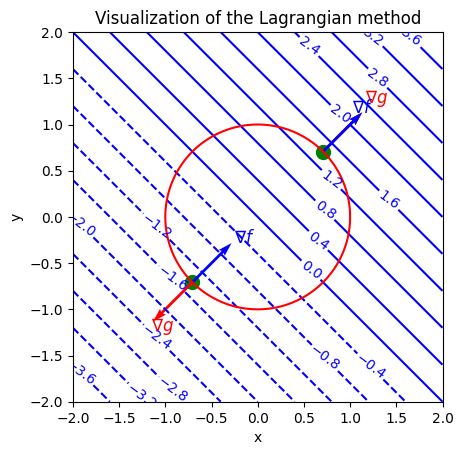

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Create a grid of x and y values
x = np.linspace(-2, 2, 400)
y = np.linspace(-2, 2, 400)
X, Y = np.meshgrid(x, y)

# Calculate the values of the Lagrangian function for the grid
lambda_values = [-1/np.sqrt(2), 1/np.sqrt(2)]  # Values of lambda
Z = f(X, Y)

# Create contour plots for the Lagrangian function and constraint
contour_levels = 20  # Number of contour levels
contour_values = plt.contour(X, Y, Z, levels=contour_levels, colors='blue')

# Label the contour lines with their values
plt.clabel(contour_values, inline=1, fontsize=10)

# Plot the constraint contour line
constraint_values = plt.contour(X, Y, g(X, Y), levels=[0], colors='red')


# Highlight the optimal points
optimal_points = [(1/np.sqrt(2), 1/np.sqrt(2)), (-1/np.sqrt(2), -1/np.sqrt(2))]
optimal_values = [f(*point) for point in optimal_points]
plt.scatter(*zip(*optimal_points), c='green', marker='o', s=100)

# Add gradient vectors at optimal points. Add also text labels
proportionality_constant = 0.3
for point in optimal_points:
    grad_g = proportionality_constant * np.array([2*point[0], 2*point[1]])
    grad_Z = proportionality_constant * np.array([*grad_f(point[0], point[1])])
    scale_factor = np.linalg.norm(grad_g) / np.linalg.norm(grad_Z)
    plt.quiver(*point, *grad_g, color='red', angles='xy', scale_units='xy', scale=1)
    plt.quiver(*point, *grad_Z*scale_factor, color='blue', angles='xy', scale_units='xy', scale=1)
    plt.text((1.04)*point[0]+grad_g[0], (1.15)*point[1]+grad_g[1], r'$\nabla g$', color='red', fontsize=12)
    plt.text((0.9)*point[0]+(0.90)*grad_Z[0]*scale_factor, point[1]+grad_Z[1]*scale_factor, r'$\nabla f$', color='blue', fontsize=12)


# Set axis labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Visualization of the Lagrangian method')

plt.axis('square')
plt.show()

 - **1d** Vuelve a resolver el problema de optimización, pero ahora hazlo minimizando la función lagrangiana $\mathcal{L}$ directamente con alguna herramienta numérica (no derives). Usa de nuevo el módulo ```scipy.optimize```. Comprueba que obtienes el mismo resultado que en el apartado anterior.

In [6]:
from scipy.optimize import minimize

def lagrangian_one_argument(vars):
    x, y, lamb = vars
    return lagrangian(x, y, lamb)

res = minimize(lagrangian_one_argument, (0,0,0), method="BFGS", tol=1e-3)

print(res.x)


[-0.70736742 -0.70736742  0.70736737]


 - **1e** Una vez más, utilizando el módulo ```scipy.optimize```, resuelve este problema de optimización, pero ahora directamente optimiza $f(x,y)$ imponiendo la restricción del problema. Es decir, no sigas la formulación de Lagrange, busca una herramienta que permita optimizar con condiciones.

In [16]:
from scipy.optimize import minimize

def f(x):
    return x[0] + x[1]

def g(x):
    return x[0]**2 + x[1]**2 - 1

x0 = (-1, -1)

constraints = [{'type': 'eq', 'fun': g}]

res = minimize(f, x0, method="SLSQP", constraints=constraints)

print(res)


 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -1.414213562374664
       x: [-7.071e-01 -7.071e-01]
     nit: 5
     jac: [ 1.000e+00  1.000e+00]
    nfev: 15
    njev: 5


## Ejercicio 2: Lagrange — Casos básicos (II)

Se pretende optimizar el siguiente problema:
$$
\begin{aligned}
\mathrm{maximizar} \quad f(x,y)= (x + y)^2 & \\
\text{ sujeto a } \quad g(x, y) \equiv x^2 + y^2 &= 1
\end{aligned}
$$
usando el método de los multiplicadores de Lagrange. A continuación se definen en Python varias funciones relevantes para este caso de estudio:



In [8]:
# Define the objective function f(x, y)
def f(x, y):
    return (x + y)**2

def grad_f(x, y):
    return np.array([2*x, 2*y])

# Define the constraint function g(x, y)
def g(x, y):
    return x**2 + y**2 - 1

# Define the Lagrangian function L(x, y, lambda)
def lagrangian(x, y, lambda_):
    return f(x, y) + lambda_ * g(x, y)

 - **2a** El siguiente bloque de código muestra en un gráfico 3D la función a maximizar $f(x,y)$, la restricción $g(x,y)$ sobre el plano $OXY$ y su proyección sobre $f(x,y)$. Estima visualmente dónde aparecerán los máximos del problema.

In [9]:

# Create a grid of x and y values
x = np.linspace(-1.1, 1.1, 200)
y = np.linspace(-1.1, 1.1, 200)
X, Y = np.meshgrid(x, y)

# Calculate the function values
Z = f(X,Y)
Z2 = np.cos(X) + np.sin(Y)
# Create the 3D surface plot
fig = go.Figure()

# Add the 3D surface plot
fig.add_trace(go.Surface(z=Z, x=X, y=Y, name='f(x, y) = x + y', showscale=False))

# Create the 2D circle curve in the OXY plane
t = np.linspace(0, 2 * np.pi, 100)

trace_circle_OXY = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=np.zeros_like(x),
    mode='lines',
    marker=dict(color='black', size=20),
    line=dict(width=20),
    showlegend=False
)

trace_circle_proj = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=f(np.cos(t), np.sin(t)),
    mode='lines',
    marker=dict(color='green', size=20),
    line=dict(width=20),
    showlegend=False
)

# Add the 2D circle projection onto the OXY plane
fig.add_trace(trace_circle_OXY)
fig.add_trace(trace_circle_proj)

fig.show()


 - **2b** Resuelve el sistema de ecuaciones resultante de plantear el problema de Lagrange. Utiliza el módulo ```scipy.optimize``` para su resolución.

In [10]:
from scipy.optimize import fsolve, root

def equations(vars):
    x, y, lamb = vars

    eq1 = 2.0 * (x + y) + 2.0 * lamb * x
    eq2 = 2.0 * (x + y) + 2.0 * lamb * y
    eq3 = x**2 + y**2 - 1.0

    return [eq1, eq2, eq3]

x_opt, y_opt, lamb_opt = fsolve(equations, (-1,-1,1))

print(x_opt, y_opt, lamb_opt)

-0.7071067811865482 -0.7071067811865468 -1.9999999999999996


 - **2c** El siguiente bloque de código muestra las cuervas de nivel de la función a optimizar, junto con la curva restricción. En base a esta imagen, analiza geométricamente el problema de optimización de Lagrange.

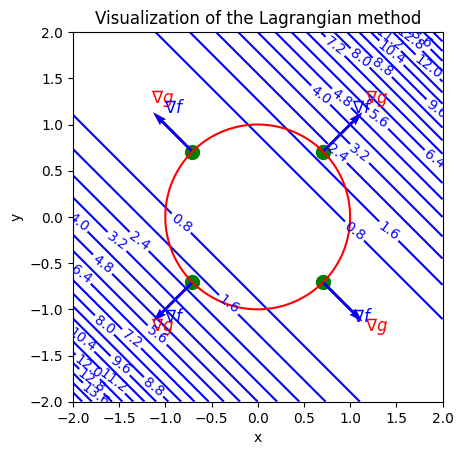

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Create a grid of x and y values
x = np.linspace(-2, 2, 400)
y = np.linspace(-2, 2, 400)
X, Y = np.meshgrid(x, y)

# Calculate the values of the Lagrangian function for the grid
lambda_values = [0, -2]  # Values of lambda
Z = f(X, Y)

# Create contour plots for the Lagrangian function and constraint
contour_levels = 20  # Number of contour levels
contour_values = plt.contour(X, Y, Z, levels=contour_levels, colors='blue')

# Label the contour lines with their values
plt.clabel(contour_values, inline=1, fontsize=10)

# Plot the constraint contour line
constraint_values = plt.contour(X, Y, g(X, Y), levels=[0], colors='red')

# Highlight the optimal points
optimal_points = [(1/np.sqrt(2), 1/np.sqrt(2)), (-1/np.sqrt(2), -1/np.sqrt(2)),
                  (-1/np.sqrt(2), 1/np.sqrt(2)), (1/np.sqrt(2), -1/np.sqrt(2))]
optimal_values = [f(*point) for point in optimal_points]
plt.scatter(*zip(*optimal_points), c='green', marker='o', s=100)

# Add gradient vectors at optimal points. Add also text labels
proportionality_constant = 0.3
for point in optimal_points:
    grad_g = proportionality_constant * np.array([2*point[0], 2*point[1]])
    grad_Z = proportionality_constant * np.array([*grad_f(point[0], point[1])])
    scale_factor = np.linalg.norm(grad_g) / np.linalg.norm(grad_Z)
    plt.quiver(*point, *grad_g, color='red', angles='xy', scale_units='xy', scale=1)
    plt.quiver(*point, *grad_Z*scale_factor, color='blue', angles='xy', scale_units='xy', scale=1)
    plt.text((1.04)*point[0]+grad_g[0], (1.15)*point[1]+grad_g[1], r'$\nabla g$', color='red', fontsize=12)
    plt.text((0.9)*point[0]+(0.90)*grad_Z[0]*scale_factor, point[1]+grad_Z[1]*scale_factor, r'$\nabla f$', color='blue', fontsize=12)


# Set axis labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Visualization of the Lagrangian method')

plt.axis('square')
plt.show()

 - **2d** Utilizando el módulo ```scipy.optimize```, resuelve este problema de optimización, pero ahora directamente optimiza $f(x,y)$ imponiendo la restricción del problema. Es decir, no sigas la formulación de Lagrange, busca una herramienta que permita optimizar con condiciones.

In [14]:
from scipy.optimize import minimize

def f(x):
    return (x[0] + x[1])**2

def g(x):
    return x[0]**2 + x[1]**2 -1

x0 = (-1, -1)

constraints = [{'type': 'eq', 'fun': g}]

res = minimize(f, x0, method="SLSQP", constraints=constraints)

print(res)


 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 2.0000000000044373
       x: [-7.071e-01 -7.071e-01]
     nit: 5
     jac: [-2.828e+00 -2.828e+00]
    nfev: 15
    njev: 5


## Ejercicio 3: Lagrange — Casos básicos (III)

Se pretende optimizar el siguiente problema:
$$
\begin{aligned}
\mathrm{maximizar} \quad f(x,y)= x^2y & \\
\text{ sujeto a } \quad g(x, y) \equiv x^2 + y^2 &= 3
\end{aligned}
$$
usando el método de los multiplicadores de Lagrange. A continuación se definen en Python varias funciones relevantes para este caso de estudio:



In [8]:
# Define the objective function f(x, y)
def f(x, y):
    return x**2 * y

def grad_f(x, y):
    return np.array([2*x*y, x**2])

# Define the constraint function g(x, y)
def g(x, y):
    return x**2 + y**2 - 3

# Define the Lagrangian function L(x, y, lambda)
def lagrangian(x, y, lambda_):
    return f(x, y) + lambda_ * g(x, y)

 - **3a** El siguiente bloque de código muestra en un gráfico 3D la función a maximizar $f(x,y)$, la restricción $g(x,y)$ sobre el plano $OXY$ y su proyección sobre $f(x,y)$. Estima visualmente dónde aparecerán los máximos del problema.

In [9]:

# Create a grid of x and y values
x = np.linspace(-1.1, 1.1, 200)
y = np.linspace(-1.1, 1.1, 200)
X, Y = np.meshgrid(x, y)

# Calculate the function values
Z = f(X,Y)
Z2 = 3 * (np.cos(X) + np.sin(Y))
# Create the 3D surface plot
fig = go.Figure()

# Add the 3D surface plot
fig.add_trace(go.Surface(z=Z, x=X, y=Y, name='f(x, y) = x + y', showscale=False))

# Create the 2D circle curve in the OXY plane
t = np.linspace(0, 2 * np.pi, 100)

trace_circle_OXY = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=np.zeros_like(x),
    mode='lines',
    marker=dict(color='black', size=20),
    line=dict(width=20),
    showlegend=False
)

trace_circle_proj = go.Scatter3d(
    x=np.cos(t),
    y=np.sin(t),
    z=f(np.cos(t), np.sin(t)),
    mode='lines',
    marker=dict(color='green', size=20),
    line=dict(width=20),
    showlegend=False
)

# Add the 2D circle projection onto the OXY plane
fig.add_trace(trace_circle_OXY)
fig.add_trace(trace_circle_proj)

fig.show()


 - **3b** Resuelve el sistema de ecuaciones resultante de plantear el problema de Lagrange. Utiliza el módulo ```scipy.optimize``` para su resolución.

In [10]:
from scipy.optimize import fsolve, root

def equations(vars):
    x, y, lamb = vars

    eq1 = 2.0 * x * y + 2.0 * lamb * x
    eq2 = x**2 + 2.0 * lamb * y
    eq3 = x**2 + y**2 - 3.0

    return [eq1, eq2, eq3]

x_opt, y_opt, lamb_opt = fsolve(equations, (-1,-1,1))

print(x_opt, y_opt, lamb_opt)



-1.4142135623730947 -1.0 1.0


 - **3c** El siguiente bloque de código muestra las cuervas de nivel de la función a optimizar, junto con la curva restricción. En base a esta imagen, analiza geométricamente el problema de optimización de Lagrange.

C:\Users\jaime\AppData\Local\Temp\ipykernel_6708\1323682684.py:36: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\jaime\AppData\Local\Temp\ipykernel_6708\1323682684.py:38: RuntimeWarning:

invalid value encountered in multiply

C:\Users\jaime\AppData\Local\Temp\ipykernel_6708\1323682684.py:40: RuntimeWarning:

invalid value encountered in scalar multiply

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


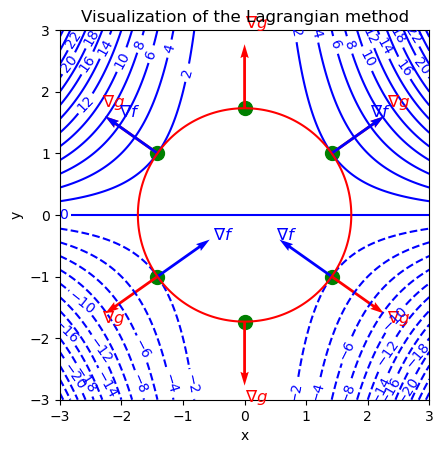

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Create a grid of x and y values
x = np.linspace(-3, 3, 400)
y = np.linspace(-3, 3, 400)
X, Y = np.meshgrid(x, y)

# Calculate the values of the Lagrangian function for the grid
lambda_values = [-1, 1, 0]  # Values of lambda
Z = f(X, Y)

# Create contour plots for the Lagrangian function and constraint
contour_levels = 26  # Number of contour levels
contour_values = plt.contour(X, Y, Z, levels=contour_levels, colors='blue')

# Label the contour lines with their values
plt.clabel(contour_values, inline=1, fontsize=10)

# Plot the constraint contour line
constraint_values = plt.contour(X, Y, g(X, Y), levels=[0], colors='red')

# Highlight the optimal points
optimal_points = [(np.sqrt(2), 1),  (-np.sqrt(2), 1),
                  (np.sqrt(2),-1), (-np.sqrt(2),-1),
                  (0, np.sqrt(3)), (0,-np.sqrt(3))]

optimal_values = [f(*point) for point in optimal_points]
plt.scatter(*zip(*optimal_points), c='green', marker='o', s=100)

# Add gradient vectors at optimal points. Add also text labels
proportionality_constant = 0.3
for point in optimal_points:
    grad_g = proportionality_constant * np.array([2*point[0], 2*point[1]])
    grad_Z = proportionality_constant * np.array([*grad_f(point[0], point[1])])
    scale_factor = np.linalg.norm(grad_g) / np.linalg.norm(grad_Z)
    plt.quiver(*point, *grad_g, color='red', angles='xy', scale_units='xy', scale=1)
    plt.quiver(*point, *grad_Z*scale_factor, color='blue', angles='xy', scale_units='xy', scale=1)
    plt.text((1.04)*point[0]+grad_g[0], (1.15)*point[1]+grad_g[1], r'$\nabla g$', color='red', fontsize=12)
    plt.text((0.9)*point[0]+(0.90)*grad_Z[0]*scale_factor, point[1]+grad_Z[1]*scale_factor, r'$\nabla f$', color='blue', fontsize=12)


# Set axis labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Visualization of the Lagrangian method')

plt.axis('square')
plt.show()

 - **3d** Utilizando el módulo ```scipy.optimize```, resuelve este problema de optimización, pero ahora directamente optimiza $f(x,y)$ imponiendo la restricción del problema. Es decir, no sigas la formulación de Lagrange, busca una herramienta que permita optimizar con condiciones.

In [12]:

from scipy.optimize import minimize

def f(x):
    return x[0]**2 * x[1]

def g(x):
    return x[0]**2 + x[1]**2 - 3

x0 = (-1, -1)

constraints = [{'type': 'eq', 'fun': g}]

res = minimize(f, x0, method="SLSQP", constraints=constraints)

print(res)



 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -1.9999997012146802
       x: [-1.414e+00 -1.000e+00]
     nit: 6
     jac: [ 2.829e+00  1.999e+00]
    nfev: 18
    njev: 6


## Ejercicio 4: [KKT] Restricciones con inecuaciones — caso 1

Resuelve el siguiente problema de optimización utiliza el módulo ```scipy.optimize``` (en particular, la función ```minimize```).
<center>
<div>
<img src="https://drive.upm.es/index.php/apps/files_sharing/ajax/publicpreview.php?x=1680&y=557&a=true&file=opt_restricciones_164.png&t=YzvqwRjVh1U0aXy&scalingup=0" width="450"/>
</div>
</center>


$$
\begin{aligned}
\mathrm{minimizar} \quad q(x)=\left(x_1-1\right)^2+\left(x_2-2.5\right)^2 & \\
\text { sujeto a} \quad x_1-2 x_2+2 & \geq 0, \\
-x_1-2 x_2+6 & \geq 0, \\
-x_1+2 x_2+2 & \geq 0, \\
x_1 & \geq 0, \\
x_2 & \geq 0 .
\end{aligned}
$$

In [13]:
from scipy.optimize import minimize

def objetivo(x):
    return (x[0]-1)**2 + (x[1]-2.5)**2
    

constraints = [{'type': 'ineq', 'fun': lambda x: x[0] - 2*x[1] + 2},
               {"type": "ineq", "fun": lambda x: -x[0] - 2*x[1] + 6},
               {"type": "ineq", "fun": lambda x: -x[0] + 2*x[1] + 2},
               {"type": "ineq", "fun": lambda x: x[0]},
               {"type": "ineq", "fun": lambda x: x[1]}
            ]

x0 = (0, 0)

res = minimize(objetivo, x0, method="SLSQP", constraints=constraints)

print(res)

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 0.799999999999998
       x: [ 1.400e+00  1.700e+00]
     nit: 4
     jac: [ 8.000e-01 -1.600e+00]
    nfev: 12
    njev: 4


## Ejercicio 5: [KKT] Restricciones con inecuaciones — caso 2

Resuelve el siguiente problema de optimización utiliza el módulo ```scipy.optimize``` (en particular, la función ```minimize```).
$$
\begin{aligned}
\mathrm{minimizar} \quad q(x) = 2x_1 + 3x_2 + 4x_1^2 + 2x_1x_2 + x_2^2 & \\
\text { sujeto a} \quad x_1 - x_2 \geq 0, \\
x_1 + x_2 \leq 4, \\
x_1 \leq 3, \\
\end{aligned}
$$

In [17]:
from scipy.optimize import minimize

def objetivo(x):
    return 2*x[0] + 3*x[1] + 4*x[0]**2 + 2*x[0]*x[1] + x[1]**2
    

constraints = [{'type': 'ineq', 'fun': lambda x: x[0] - x[1] }, # x1-x2 >= 0
               {"type":"ineq", "fun": lambda x: 4 - x[0] - X[1]}, # 4-x1-x2 >= 0
               {"type":"ineq", "fun": lambda x: 3 - x[0] }, # 3-x1 >= 0
            ]

x0 = (0, 0)

res = minimize(objetivo, x0, method="SLSQP", constraints=constraints)

print(res)

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -2.3333333333333335
       x: [ 1.667e-01 -1.667e+00]
     nit: 3
     jac: [ 5.960e-08  2.980e-08]
    nfev: 11
    njev: 3


## Ejercicio 6: Estudio analítico de un algoritmo de optimización numérica

Como has visto en los ejercicios anteriores, la función ```minimize``` del módulo ```scipy.optimize``` es ampliamente usada para problemas de optimización no entera. Esta función implementa multitud de algoritmos que permiten resolver problemas de diversa índole: con información sobre el jacobiano/hessiano o sin ella, problemas acotados, con restricciones de igualdad o de desigualdad, etc.

Explica un algoritmo de los implementados en la función ```minimize``` ([ver documentación](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html#id9), argumento ```method```), según la asignación realizada en clase.

*Escribe una breve explicación (aprox. 1 cara de A4) para la entrega, y estate preparado para explicar el método en la defensa*.

# L-BFGS-B

El L-BFGS-B es un algoritmo de optimización utilizado para resolver tanto problemas con restricciones como problemas sin restricciones. Este algoritmo es una extensión del BFGS con la diferencia de que utiliza menos memoria y puede resolver problemas con restricciones, cosa que no hace el BFGS.

Este algoritmo iterativo calcula tanto el gradiente de nuestra función objetivo como una aproximación de la inversa de la matriz Hessiana en cada una de las iteraciones. Como ya hemos dicho antes, existen dos diferencias principales con respecto al algoritmo BFGS:

1. En vez de guardar una aproximación de la inversa de la Hessiana como hace el BFGS, solo guarda algunos vectores que representan los últimos sobre las variables y los gradientes de la función. Esto hace que el algoritmo utilice menos memoria pero siga teniendo información acerca de la curvatura de la función.

2. La segunda diferencia es que este algoritmo es capaz de resolver problemas con restricciones. Una vez calculada la dirección óptima para mover nuestras variables, se asegura de que el nuevo punto caiga en la región factible de nuestro problema.

El algoritmo funciona de la siguiente manera:

1. Se inicializa un punto como aproximación del valor óptimo y una aproximación de la inversa de la matriz Hessiana.
2. Se calcula la dirección óptima a través de la fórmula: $-B_k \nabla f(x_k)$
3. Se mueve el punto respetando las restricciones del problema.
4. Si el nuevo punto no cumple las restricciones del problema, el algoritmo ajusta la longitud de paso a lo largo de esa misma dirección para que la nueva solución quede dentro de la región factible.
5. Se ajustan los valores de los vectores con los cambios en las variables y los gradientes.
6. Se comprueba si se ha llegado al criterio de convergencia.

## Ventajas de L-BFGS-B:

- **Eficiencia en Problemas Grandes:**
  - L-BFGS-B es especialmente eficiente en problemas de optimización con un gran número de variables, ya que utiliza una aproximación limitada de la inversa del Hessiano y no requiere almacenar la matriz completa del Hessiano.

- **Problemas con restricciones:**
  - L-BFGS-B es capaz de resolver problemas con restricciones. El algoritmo ajusta los pasos propuestos para garantizar que permanezcan dentro de la región factible.

## Inconvenientes de L-BFGS-B:

- **No Apto para Problemas No Suavemente Convexos:**
  - Puede no ser tan efectivo en problemas de optimización no suavemente convexos o con funciones altamente no lineales.

- **Sensibilidad a la Elección de Parámetros:**
  - Al igual que muchos algoritmos de optimización, L-BFGS-B puede ser sensible a la elección de parámetros. Ajustar los parámetros adecuadamente puede ser crucial para su rendimiento.

- **No es Globalmente Convergente:**
  - Al igual que otros métodos de optimización locales, L-BFGS-B no garantiza la convergencia global. Puede converger a un mínimo local, pero no necesariamente al mínimo global.



## Ejercicio 7: Casos de aplicación (I)

El departamento financiero de una empresa de venta y reparación de ordenadores desea maximizar su beneficio mensual ($B$) que depende de las unidades vendidas ($v$), las unidades reparadas ($r$), el número de trabajadores ($t$), y el número de clientes ($c$). El beneficio se puede modelar como sigue:

$$
B(v, r, t, c) = 20000 - 4(v - 100)^2 - 3(r - 50)^2 - t^2 + 5c^2
$$

Se sabe que la expresión anterior funciona correctamente solo cuando las unidades vendidas ($v$) están en el rango de $5$ a $100$, el número de trabajadores ($t$) es menor que $100$ y el número de ordenadores vendidos ($v$) más reparados ($r$) es menor que $102$. Además, por imposición del departamento laboral, la empresa debe contar con como mínimo dos trabajadores ($t$) por cada cliente ($c$).
 - **7a** Calcula $(v, r, t, c)$ que maximizan los beneficios de la empresa por *fuerza bruta*.


 - **7b** Calcula $(v, r, t, c)$ que maximizan los beneficios de la empresa utilizando la librería ```gurobipy``` de Python.

In [ ]:
%pip install -q gurobipy


## Ejercicio 8: Casos de aplicación (II)

Considera una cierta empresa que produce dos artículos: tazas y platos. Esto es lo que sabemos:

 - Una vez fabricada, una taza se vende a 27 € y un plato a 21 €.
 - Cada taza cuesta 10 € en materiales y 14 € en mano de obra (fijos).
 - Cada plato cuesta 9 € en materiales y 10 € en mano de obra (fijos).
 - Para fabricar cada taza se necesitan 2.2 horas de trabajo.
 - Para fabricar cada plato se necesita 1 hora de trabajo.
 - La empresa dispone de una cantidad ilimitada de materias primas.
 - Debido al número limitado de trabajadores, la empresa dispone de un máximo de 100 horas de mano de obra.
 - La demanda de tazas es ilimitada, pero la de platos es de 30 unidades.

El objetivo de la empresa es maximizar los beneficios. Resuelve este problema de optimización usando el paquete ```gurobipy```.

In [15]:
!pip install gurobipy

from gurobipy import *

  Obtaining dependency information for gurobipy from https://files.pythonhosted.org/packages/b2/c2/e8beb50f851e16650c9387e110d0276d327e9ea73d2480ca428116468118/gurobipy-11.0.0-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/10.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.2 MB ? eta -:--:--
   ---------------------------------------- 0.1/10.2 MB 4.5 MB/s eta 0:00:03
   ---------------------------------------- 0.1/10.2 MB 4.5 MB/s eta 0:00:03
   ---------------------------------------- 0.1/10.2 MB 4.5 MB/s eta 0:00:03
    --------------------------------------- 0.2/10.2 MB 1.1 MB/s eta 0:00:10
    --------------------------------------- 0.2/10.2 MB 1.1 MB/s eta 0:00:10
    --------------------------------------- 0.2/10.2 MB 1.1 MB/s eta 0:00:10
   - -------------------------------------- 0.3/10.2 MB 827.5 kB/s eta 0:00:13
   - -------------------------------------- 0.3/10.2 MB 827.5 kB/s eta 0:00:13
   - ------------------------

In [18]:
from gurobipy import Model, GRB

In [20]:
#Hemos supuesto que el enunciado esta mal escrito y que no hay una demanda de platos de 30 unidades sino que se limita los platos a 30 unidades
#Si no fuera asi, la restriccion seria 30 <= p y solo se harian platos porque es mas rentable
#Si la demanda de tazas si que fuese 30 unidades, la restriccion seria 30 <= t haria 30 tazas y 34 platos.

# Create a new model
m = Model("mip1")

# Create variables
p = m.addVar(vtype=GRB.INTEGER, name="plato")
t = m.addVar(vtype=GRB.INTEGER, name="taza")

# Set objective
m.setObjective(27*t + 21*p - (10+14)*t - (9+10)*p, GRB.MAXIMIZE)

# Add constraint: p<=30

m.addConstr(p <= 30, "c0")

# Add constraint: 2.2t + 1p <= 100
m.addConstr(2.2*t + 1*p <= 100, "c1")

# Optimize model
m.optimize()

for v in m.getVars():
    print('%s: %g' % (v.varName, v.x))

print('Obj: %g' % m.objVal)


Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (win64 - Windows 10.0 (19045.2))

CPU model: Intel(R) Core(TM) i7-7700K CPU @ 4.20GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 2 rows, 2 columns and 3 nonzeros
Model fingerprint: 0xa933286c
Variable types: 0 continuous, 2 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+00]
  Objective range  [2e+00, 3e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e+01, 1e+02]
Found heuristic solution: objective 153.0000000
Presolve removed 1 rows and 0 columns
Presolve time: 0.00s
Presolved: 1 rows, 2 columns, 2 nonzeros
Variable types: 0 continuous, 2 integer (0 binary)
Found heuristic solution: objective 154.0000000

Root relaxation: cutoff, 0 iterations, 0.00 seconds (0.00 work units)

Explored 1 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 8 (of 8 available processors)

Solution count 2: 

## Ejercicio 9: Regresión lineal

La regresión puede verse como un problema de optimización. Podemos aprovechar la estructura computacional que montamos en las clases anteriores para estudiar casos de regresión. Comencemos con el caso más simple posible: la regresión lineal. Piensa en una red formada por una única neurona con un único input. La operación que realiza esta neurona sobre el input es una aplicación lineal de la forma $wx+b$. Por tanto, como el, objetivo del entrenamiento sobre una red neuronal es optimizar $w$ y $b$, en verdad se está resolviendo una problema de regresión.

Usaremos las siguientes clases que ya programamos en clases anteriores:

In [ ]:
from abc import ABC, abstractmethod

class Layer_Dense:

    def __init__(self, n_inputs, n_neurons):
        self.weights = 0.01 * np.random.randn(n_inputs, n_neurons)
        self.biases = np.zeros((1, n_neurons))

    def forward(self, inputs):
        self.inputs = inputs
        self.output = np.dot(inputs, self.weights) + self.biases

    def backward(self, dvalues):
        self.dweights = np.dot(self.inputs.T, dvalues)
        self.dbiases = np.sum(dvalues, axis=0, keepdims=True)
        self.dinputs = np.dot(dvalues, self.weights.T)


class Activation_ReLU:

    def forward(self, inputs):
        self.inputs = inputs
        self.output = np.maximum(0, inputs)

    def backward(self, dvalues):
        self.dinputs = dvalues.copy()
        self.dinputs[self.inputs <= 0] = 0


class Optimizer_SGD:

    def __init__(self, learning_rate=1., decay=0., momentum=0.):
        self.learning_rate = learning_rate
        self.current_learning_rate = learning_rate
        self.decay = decay
        self.iterations = 0
        self.momentum = momentum

    def pre_update_params(self):
        if self.decay:
            self.current_learning_rate = self.learning_rate * (1. / (1. + self.decay * self.iterations))

    def update_params(self, layer):

        if self.momentum:

            if not hasattr(layer, 'weight_momentums'):
                layer.weight_momentums = np.zeros_like(layer.weights)
                layer.bias_momentums = np.zeros_like(layer.biases)

            weight_updates = self.momentum * layer.weight_momentums - self.current_learning_rate * layer.dweights
            layer.weight_momentums = weight_updates

            bias_updates = self.momentum * layer.bias_momentums - self.current_learning_rate * layer.dbiases
            layer.bias_momentums = bias_updates

        else:
            weight_updates = -self.current_learning_rate * layer.dweights
            bias_updates = -self.current_learning_rate * layer.dbiases

        layer.weights += weight_updates
        layer.biases += bias_updates

    def post_update_params(self):
        self.iterations += 1


class Loss(ABC):

    @abstractmethod
    def forward(self, output, y):
        pass

    def calculate(self, output, y):
        sample_losses = self.forward(output, y)
        data_loss = np.mean(sample_losses)
        return data_loss

La función de activación que usaremos es:

In [ ]:
class Activation_Linear:
    # Forward pass
    def forward(self, inputs):
        self.inputs = inputs
        self.output = inputs

    # Backward pass
    def backward(self, dvalues):
        self.dinputs = dvalues.copy()

 - **9a** Programa la nueva función de pérdidas: el error cuadrático medio (MSE). Llámala ```Loss_MeanSquaredError```. No olvides heredar de la clase abstracta ```Loss```, e implementar tanto el *forward* como el *backward pass*.

In [ ]:
class Loss_MeanSquaredError(Loss):

    #Forward pass
    def forward(self, y_pred, y_true):
        sample_losses = np.mean((y_true - y_pred)**2, axis=-1)
        # sample_losses = (y_true - y_pred)**2

        return sample_losses

    #Backward pass
    def backward(self, y_pred, y_true):
        outputs = len(y_pred[0])

        samples = len(y_pred)

        self.dinputs = -2.0 * (y_true - y_pred) / outputs

        #Normalizar
        self.dinputs = self.dinputs / samples


 - **9b** Define una arquitectura red con una única neurona (un input), función de activación lineal, error cuadrático medio como función de pérdidas y un optimizador de descenso de gradiente (*learning rate* de 0.01, resto de parámetros por defecto). Realiza un entrenamiento en dicha red y observa el resultado obtenido. En particular, asegúrate que el peso y el bias de la neurona coinciden con los que obtendrías resolviendo el problema de regresión de forma tradicional (derivando el MSE respecto a cada parámetro, igualando a cero y resolviendo el sistema resultante). Usa los siguientes datos de entrenamiento (regresión lineal):

$$
\begin{array}{|c|c|}
\hline x_i & y_i \\
\hline 1 & 6 \\
\hline 2 & 5 \\
\hline 3 & 7 \\
\hline 4 & 10 \\
\hline
\end{array}
$$


In [ ]:
X = np.array([[1], [2], [3], [4]])  # [1, 2, 3, 4]
y = np.array([6, 5, 7, 10]).reshape(len(X), 1)

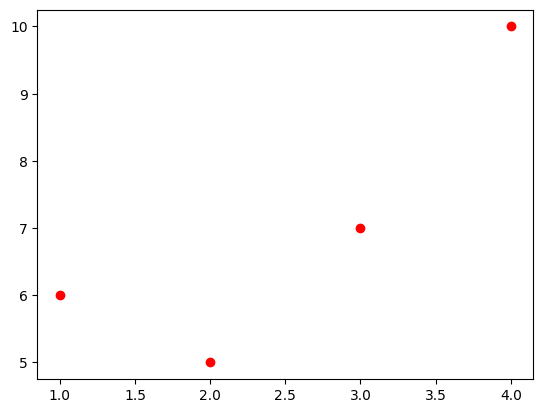

In [ ]:
import matplotlib.pyplot as plt

plt.plot(X[:, np.newaxis, 0], y, 'ro')

In [ ]:
dense1 = Layer_Dense(X.shape[1], 1)
# activación (...)
loss_layer = Loss_MeanSquaredError()
optimizer = Optimizer_SGD(learning_rate=0.01)

#Entrenamiento
for epoch in range(50000):

    #Forward
    dense1.forward(X)
    loss = loss_layer.calculate(dense1.output, y)

    if not epoch % 1000:
        print(f"{epoch=}  {loss=}")

    #Backward
    loss_layer.backward(dense1.output, y)
    dense1.backward(loss_layer.dinputs)

    # Update parameters
    optimizer.update_params(dense1)


epoch=0  loss=52.539569070704275
epoch=1000  loss=1.0530500688749336
epoch=2000  loss=1.0500075846975399
epoch=3000  loss=1.0500000188610947
epoch=4000  loss=1.050000000046903
epoch=5000  loss=1.0500000000001164
epoch=6000  loss=1.0500000000000003
epoch=7000  loss=1.0499999999999996
epoch=8000  loss=1.0499999999999996
epoch=9000  loss=1.0500000000000005
epoch=10000  loss=1.05
epoch=11000  loss=1.0499999999999998
epoch=12000  loss=1.0499999999999998
epoch=13000  loss=1.0499999999999998
epoch=14000  loss=1.0499999999999998
epoch=15000  loss=1.0499999999999998
epoch=16000  loss=1.0499999999999998
epoch=17000  loss=1.0499999999999998
epoch=18000  loss=1.0499999999999998
epoch=19000  loss=1.0499999999999998
epoch=20000  loss=1.0499999999999998
epoch=21000  loss=1.0499999999999998
epoch=22000  loss=1.0499999999999998
epoch=23000  loss=1.0499999999999998
epoch=24000  loss=1.0499999999999998
epoch=25000  loss=1.0499999999999998
epoch=26000  loss=1.0499999999999998
epoch=27000  loss=1.049999999

In [ ]:
a = float(dense1.biases.flatten()[0])
b = float(dense1.weights.flatten()[0])

print(f"La recta de regresión es y = {b:.1f} * x + {a:.1f}")

La recta de regresión es y = 1.4 * x + 3.5


## Ejercicio 10: Regresión multilineal

Ahora utilizaremos la base de datos ```diabetes``` del paquete ```scikit-learn```, que contiene datos de pacientes con diabetes (10 variables por observación), y una medida de la evolución de la enfermedad en un periodo de un año (variable a predecir $y$). Por tanto, ahora estamos en un caso de regresión multilineal: queremos ajustar una función del tipo

$$
\hat{y} = b + w_0 x_0 + w_1 x_1 + \ldots + w_{9} x_{9}
$$

Donde $b, w_0, w_1 \ldots, w_{9}$ son los coeficientes de regresión que deseamos estimar, $x_1, x_2, \ldots, x_{9}$ son las variables independientes.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets

diabetes = datasets.load_diabetes()
X = diabetes['data']
y = diabetes['target'].reshape(-1, 1)

Define una arquitectura apropiada análoga a la del ejercicio anterior. Realiza el entrenamiento y grafica alguna variable junto a la proyección del hiperplano para comprobar resultados

In [ ]:
dense1 = Layer_Dense(X.shape[1], 1)
# activación (...)
loss_layer = Loss_MeanSquaredError()
optimizer = Optimizer_SGD(learning_rate=0.01)

#Entrenamiento
for epoch in range(500000):

    #Forward
    dense1.forward(X)
    loss = loss_layer.calculate(dense1.output, y)

    if not epoch % 1000:
        print(f"{epoch=}  {loss=}")

    #Backward
    loss_layer.backward(dense1.output, y)
    dense1.backward(loss_layer.dinputs)

    # Update parameters
    optimizer.update_params(dense1)

epoch=0  loss=29074.5253545405
epoch=1000  loss=5260.474019821762
epoch=2000  loss=4772.072519769771
epoch=3000  loss=4411.637780323612
epoch=4000  loss=4142.075102269133
epoch=5000  loss=3937.421472305312
epoch=6000  loss=3779.4670194410974
epoch=7000  loss=3655.405737476042
epoch=8000  loss=3556.2015077135034
epoch=9000  loss=3475.4512711519437
epoch=10000  loss=3408.593769113387
epoch=11000  loss=3352.35852264206
epoch=12000  loss=3304.381856072931
epoch=13000  loss=3262.939097776737
epoch=14000  loss=3226.7576048039955
epoch=15000  loss=3194.8860377612737
epoch=16000  loss=3166.6028026978515
epoch=17000  loss=3141.351781941346
epoch=18000  loss=3118.6970931550663
epoch=19000  loss=3098.29112996783
epoch=20000  loss=3079.8518850150554
epoch=21000  loss=3063.146771037375
epoch=22000  loss=3047.9810003280186
epoch=23000  loss=3034.1891702211715
epoch=24000  loss=3021.6291109285953
epoch=25000  loss=3010.1773363771304
epoch=26000  loss=2999.725636656771
epoch=27000  loss=2990.178488582

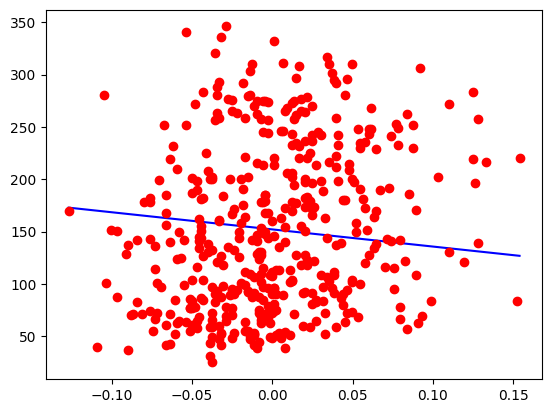

In [ ]:
var_num = 4

x_points = np.linspace(min(X[:, np.newaxis, var_num]), max(X[:, np.newaxis, var_num]), 100)
y_points = dense1.biases.flatten() + dense1.weights[var_num] * x_points

plt.plot(x_points, y_points, 'b')
plt.plot(X[:, np.newaxis, var_num], y, 'ro')
plt.show()

## Ejercicio 11: Regularización L2 — capa

Actualiza la clase ```Layer```. Ahora debe contener también la inicialización de los parámetros ```self.weight_regularizer_l2``` y ```self.bias_regularizer_l2``` (por defecto, ambos deben valer ```0```). También debes actualizar el método ```backward``` para que tenga en cuenta el impacto de la regularización en ```self.dweights``` y ```self.dbiases```.

In [ ]:
class Layer_Dense:

    def __init__(self, n_inputs, n_neurons, weight_regularizer_l2 = 0.0, bias_regularizer_l2 = 0.0):
        self.weights = 0.01 * np.random.randn(n_inputs, n_neurons)
        self.biases = np.zeros((1, n_neurons))
        self.weight_regularizer_l2 = weight_regularizer_l2
        self.bias_regularizer_l2 = bias_regularizer_l2

    def forward(self, inputs):
        self.inputs = inputs
        self.output = np.dot(inputs, self.weights) + self.biases

    def backward(self, dvalues):
        self.dweights = np.dot(self.inputs.T, dvalues)

        if self.weight_regularizer_l2 > 0:
            self.dweights += 2 * self.weight_regularizer_l2 * self.weights

        self.dbiases = np.sum(dvalues, axis=0, keepdims=True)

        if self.bias_regularizer_l2 > 0:
            self.dbiases += 2 * self.bias_regularizer_l2 * self.biases

        self.dinputs = np.dot(dvalues, self.weights.T)


## Ejercicio 12: Regularización L2 — péridas

Extiende la clase abstracta ```Loss``` para que incluya un método llamado ```regularization_loss(self, layer)``` que calcule el los términos de regularización de la función de pérdidas para la capa ```layer``` pasada como argumento. Una vez implementado, no olvides ejecutar de nuevo (o copiar y ejecutar) la clase ```Loss_MeanSquaredError``` para actualizarla. Las pérdidas de regularización que calcularás con esta función deberán añadirse a las "normales" que venías calculando hasta ahora (llamémoslas *perdidas de los datos*) para dar lugar a las pérdidas totales. Tenlo en cuenta para el siguiente ejercicio.

In [ ]:
class Loss(ABC):

    @abstractmethod
    def forward(self, output, y):
        pass

    def calculate(self, output, y):
        sample_losses = self.forward(output, y)
        data_loss = np.mean(sample_losses)
        return data_loss

    def regularization_loss(self, layer):

        regularization_loss = 0

        if layer.weight_regularizer_l2 > 0:
            regularization_loss += layer.weight_regularizer_l2 * np.sum(layer.weights * layer.weights)

        if layer.bias_regularizer_l2 > 0:
            regularization_loss += layer.bias_regularizer_l2 * np.sum(layer.biases * layer.biases)


        return regularization_loss

In [ ]:
class Loss_MeanSquaredError(Loss):

    #Forward pass
    def forward(self, y_pred, y_true):
        sample_losses = np.mean((y_true - y_pred)**2, axis=-1)
        # sample_losses = (y_true - y_pred)**2

        return sample_losses

    #Backward pass
    def backward(self, y_pred, y_true):
        outputs = len(y_pred[0])

        samples = len(y_pred)

        self.dinputs = -2.0 * (y_true - y_pred) / outputs

        #Normalizar
        self.dinputs = self.dinputs / samples


## Ejercicio 13: Regresión — caso función seno

La base de datos ```sine_data``` del módulo ```nnfs.datasets``` es una sencilla representación de la función seno.

In [ ]:
%pip install -q nnfs

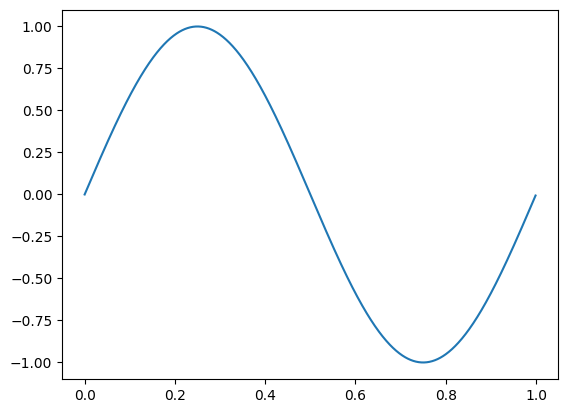

In [ ]:
import numpy as np
import nnfs
from nnfs.datasets import sine_data

nnfs.init()

# Create dataset
X, y = sine_data()

plt.plot(X, y)
plt.show()

Este ejercicio plantea entrenar una red neuronal para que aprenda el comportamiento de esta función. Sigue el siguiente proceso:
 - Define la siguiente arquitectura: una capa con un único input y 64 neuronas + función de activación ReLU + otra capa con otras 64 neuronas (con parámetros ```weight_regularizer_l2=0.001``` y ```bias_regularizer_l2=0.001```) + función de activación ReLU + una última capa con 64 inputs y un único output que dará el valor predicho de $y$ tras pasar por una función de activación lineal.
 - Utiliza como función de pérdidas el error cuadrático medio.
 - Define el siguiente optimizador: ```Optimizer_SGD(learning_rate=0.05, decay=1e-3, momentum=0.9)```
 - Define la variable: ```accuracy_precision = np.std(y) / 250```. Servirá para calcular la precisión (*accuracy*). Durante el entrenamiento, puedes hacer: ```accuracy = np.mean(np.absolute(predictions - y) < accuracy_precision)```.
 - Realiza el entrenamiento (5000 iteraciones). Utiliza validación cruzada para evaluar los resultados.

epoch=0  loss=0.5004055532305541
epoch=100  loss=0.49988496001434957
epoch=200  loss=0.16143694193110028
epoch=300  loss=0.09623685967755582
epoch=400  loss=0.06756346018770791
epoch=500  loss=0.05326211902063714
epoch=600  loss=0.03422526047036453
epoch=700  loss=0.02161499712133232
epoch=800  loss=0.01359270259989194
epoch=900  loss=0.009831631587435555
epoch=1000  loss=0.008282332142078668
epoch=1100  loss=0.007491369629836031
epoch=1200  loss=0.006987712572580103
epoch=1300  loss=0.006628732083014493
epoch=1400  loss=0.0063414580465668115
epoch=1500  loss=0.006099518648383243
epoch=1600  loss=0.005889173085387545
epoch=1700  loss=0.005702466736148035
epoch=1800  loss=0.005534564579320703
epoch=1900  loss=0.005382306886036484
epoch=2000  loss=0.0052431751137411095
epoch=2100  loss=0.005115940543281457
epoch=2200  loss=0.004999947412435163
epoch=2300  loss=0.004892966861233643
epoch=2400  loss=0.004793656319849816
epoch=2500  loss=0.004701262970124758
epoch=2600  loss=0.0046150572288

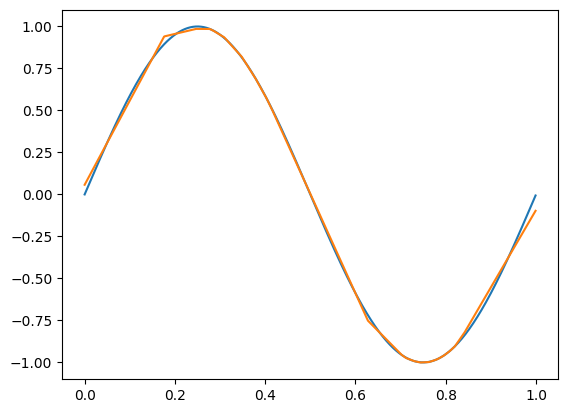

In [ ]:
dense1 = Layer_Dense(1, 64)

activation1 = Activation_ReLU()

dense2 = Layer_Dense(64, 64, weight_regularizer_l2=0.001, bias_regularizer_l2=0.001)

activation2 = Activation_ReLU()

dense3 = Layer_Dense(64, 1)

loss_function = Loss_MeanSquaredError()

optimizer = Optimizer_SGD(learning_rate=0.05, decay=1e-3, momentum=0.9)

# Training loop

for epoch in range(6000):

    dense1.forward(X)
    activation1.forward(dense1.output)
    dense2.forward(activation1.output)
    activation2.forward(dense2.output)
    dense3.forward(activation2.output)

    data_loss = loss_function.calculate(dense3.output, y)

    regularization_loss = loss_function.regularization_loss(dense1) + \
                          loss_function.regularization_loss(dense2) + \
                          loss_function.regularization_loss(dense3)

    loss = data_loss + regularization_loss
    # Precisión.... accuracy (...)

    if not epoch%100:
        print(f"{epoch=}  {loss=}")

    loss_function.backward(dense3.output, y)
    dense3.backward(loss_function.dinputs)
    activation2.backward(dense3.dinputs)
    dense2.backward(activation2.dinputs)
    activation1.backward(dense2.dinputs)
    dense1.backward(activation1.dinputs)

    #Updates
    optimizer.pre_update_params()
    optimizer.update_params(dense1)
    optimizer.update_params(dense2)
    optimizer.update_params(dense3)
    optimizer.post_update_params()

# Test model
X_test, y_test = sine_data()
dense1.forward(X_test)
activation1.forward(dense1.output)
dense2.forward(activation1.output)
activation2.forward(dense2.output)
dense3.forward(activation2.output)

plt.plot(X_test, y_test)
plt.plot(X_test, dense3.output)
plt.show()









